In [1]:
#To clone the repo to the Local system
url = "https://github.com/numenta/NAB.git"
run(`git clone $url`)

Cloning into 'NAB'...
Updating files: 100% (1186/1186), done.


Process(`git clone https://github.com/numenta/NAB.git`, ProcessExited(0))

In [2]:
using Pkg
Pkg.add(["Flux", "CUDA", "CSV", "DataFrames", "Dates", "FFTW", "StatsBase",
         "Statistics", "Random", "Plots", "BSON","JSON","MLJTuning",])
using Flux, CUDA, BSON, CSV, DataFrames, Dates, Statistics, Random, Plots, JSON, BSON, MLJTuning, FFTW, StatsBase

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed StatisticalTraits ──────── v3.4.0
   Installed ZygoteRules ────────────── v0.2.7
   Installed CategoricalDistributions ─ v0.1.15
   Installed LearnAPI ───────────────── v1.0.1
   Installed ContextVariablesX ──────── v0.1.3
   Installed InitialValues ──────────── v0.3.1
   Installed Accessors ──────────────── v0.1.42
   Installed ShowCases ──────────────── v0.1.0
   Installed MLCore ─────────────────── v1.0.0
   Installed FLoopsBase ─────────────── v0.1.1
   Installed ProgressLogging ────────── v0.1.4
   Installed PrettyPrint ────────────── v0.2.0
   Installed MLUtils ────────────────── v0.4.8
   Installed IRTools ────────────────── v0.4.14
   Installed RealDot ────────────────── v0.1.0
   Installed Zygote ─────────────────── v0.7.6
   Installed DefineSingletons ───────── v0.1.2
   Installed NameResolution ─────────── v0.1.5
   Installed ComputationalResources ─── v0.3.2
   Installe

In [3]:
#using Flux: @epochs, train!

In [4]:
# Set random seed for reproducibility
Random.seed!(123)

TaskLocalRNG()

In [5]:
# Mean Absolute Error (MAE) function
function mae(ŷ, y)
    return mean(abs.(ŷ .- y))
end

mae (generic function with 1 method)

In [6]:

# Function to parse the Timestamp
function parse_timestamps(timestamps)
    #Common formats
    formats = [
        dateformat"yyyy-mm-dd HH:MM:SS",
        dateformat"yyyy-mm-ddTHH:MM:SS",
        dateformat"yyyy-mm-ddTHH:MM:SS.s"
    ]

    for format in formats
        try
            return DateTime.(timestamps, format)
        catch
            continue
        end
    end

    # Error Handling
    # If all formats fail, print an example timestamp and raise error
    println("Example timestamp: $(timestamps[1])")
    error("Could not parse timestamps with any of the common formats")
end


parse_timestamps (generic function with 1 method)

In [7]:

# --- Dynamic Preprocessing ---

function adaptive_preprocessing(df)
    # Convert time differences to milliseconds as numeric values
    time_diffs = diff(df.timestamp)
    time_diffs_ms = Dates.value.(time_diffs)  # Convert to integer milliseconds

    # Calculate median frequency in milliseconds
    median_freq_ms = median(time_diffs_ms)
    median_freq = Millisecond(median_freq_ms)  # Convert back to Millisecond type

    # Auto-adjust window size based on frequency
    seq_len = if median_freq < Minute(5)
        128  # High frequency
    elseif median_freq < Hour(1)
        64
    else
        32
    end

    # Handle sparse anomalies
    if :label in names(df)
        anomaly_ratio = sum(df.label) / nrow(df)
        if anomaly_ratio < 0.01
            seq_len = min(seq_len, 32)
        end
    end

    # --- Data Variance Analysis ---
    data_values = df.value
    data_var = var(data_values)

    # Variance-based scaling (absolute thresholds)
    if data_var > 1e4
        seq_len = min(seq_len + 32, 256)
    elseif data_var < 1e2
        seq_len = max(seq_len - 16, 16)
    end

    return seq_len
end


adaptive_preprocessing (generic function with 1 method)

In [8]:

# --- Data Preparation with Train-Test Split ---
function prepare_nab_data(file_path, test_size=0.2)
    # Load NAB data
    df = CSV.File(file_path) |> DataFrame

    # Convert timestamp to DateTime
    df.timestamp = parse_timestamps(df.timestamp)

    # Sort by timestamp
    sort!(df, :timestamp)

    # Calculate split point
    n = nrow(df)
    split_idx = floor(Int, n * (1 - test_size))

    # Split data
    train_df = df[1:split_idx, :]
    test_df = df[(split_idx+1):end, :]

    # Calculate normalization parameters from training data only
    train_mean = mean(train_df.value)
    train_std = std(train_df.value)

    # Normalize both sets using training parameters
    train_df.normalized_value = (train_df.value .- train_mean) ./ train_std
    test_df.normalized_value = (test_df.value .- train_mean) ./ train_std

    # Get dynamic sequence length from training data
    seq_len = adaptive_preprocessing(train_df)

    return train_df, test_df, train_mean, train_std, split_idx, seq_len
end


prepare_nab_data (generic function with 2 methods)

In [9]:

# --- Prepare sequences for model training and prediction ---
function create_sequences(data::Vector{Float64}, seq_len::Int)
    num_sequences = length(data) - seq_len

    X = Matrix{Float64}(undef, seq_len, num_sequences)
    Y = Vector{Float64}(undef, num_sequences)

    for i in 1:num_sequences
        range = i:(i+seq_len-1)
        X[:, i] = data[range]
        Y[i] = data[range[end]+1]
    end

    return reshape(X, 1, seq_len, :), Y
end



create_sequences (generic function with 1 method)

In [10]:
# --- Train model with Early Stopping ---
function train_lstm_model(X_train, Y_train, X_val, Y_val;
    epochs=200, patience=15, min_delta=0.001)

    # Define model architecture
    model = Chain(
        LSTM(1 => 64),
        xs -> xs[:, end, :],
        Dense(64 => 32, relu),
        Dropout(0.2),
        Dense(32 => 1, relu),
        x -> vec(x)
    )

    # Optimizer
    opt = Adam(0.001)
    state = Flux.setup(opt, model)

    # For early stopping
    best_val_loss = Inf
    best_model = deepcopy(model)
    patience_counter = 0

    # Training history
    train_losses = Float32[]
    val_losses = Float32[]

    for epoch in 1:epochs
        # Reset LSTM state
        Flux.reset!(model)

        # Forward pass and gradient computation
        loss, grads = Flux.withgradient(model) do m
            preds = m(X_train)
            mae(preds, Y_train)
        end

        # Update model
        Flux.update!(state, model, grads)

        # Validate
        Flux.reset!(model)
        val_predictions = model(X_val)
        val_loss = mae(val_predictions, Y_val)

        # Store losses
        push!(train_losses, loss)
        push!(val_losses, val_loss)

        # Early stopping check
        if val_loss < best_val_loss - min_delta
            best_val_loss = val_loss
            best_model = deepcopy(model)
            patience_counter = 0
        else
            patience_counter += 1
            if patience_counter >= patience
                println("Early stopping at epoch $epoch")
                break
            end
        end

        # Print progress
        if epoch % 10 == 0
            println("Epoch $epoch: Train Loss = $(round(loss, digits=4)), Val Loss = $(round(val_loss, digits=4))")
        end
    end


    # Plot training curves
    p = plot(
        train_losses,
        label="Training Loss",
        linewidth=2,
        xlabel="Epoch",
        ylabel="Loss (MAE)",
        title="Training and Validation Loss"
    )
    plot!(p, val_losses, label="Validation Loss", linewidth=2, linestyle=:dash)
    display(p)

    return best_model, train_losses, val_losses
end


train_lstm_model (generic function with 1 method)

In [11]:
# --- Conformal Prediction Implementation ---
struct ConformalPredictor
    model::Chain
    calibration_errors::Vector{Float64}
    mean::Float64
    std::Float64
    seq_len::Int64
end


In [12]:
function train_conformal_predictor(model, X_calib, Y_calib, mean_val, std_val, seq_len)
    # Reset LSTM state
    Flux.reset!(model)

    # Make predictions on calibration set
    predictions = model(X_calib)

    # Calculate absolute errors for calibration
    errors = abs.(predictions .- Y_calib)

    # Sort errors for quantile calculation
    sorted_errors = sort(errors)

    return ConformalPredictor(model, sorted_errors, mean_val, std_val, seq_len)
end


train_conformal_predictor (generic function with 1 method)

In [13]:
function predict_with_intervals(predictor::ConformalPredictor, X_new, alpha=0.1)
    # Reset LSTM state
    Flux.reset!(predictor.model)

    # Make point predictions
    point_predictions = predictor.model(X_new)

    # Get appropriate quantile from calibration errors
    n_calib = length(predictor.calibration_errors)
    quantile_idx = ceil(Int, (n_calib + 1) * (1 - alpha))

    if quantile_idx > n_calib
        quantile_idx = n_calib
    end

    # Get error margin for prediction interval
    error_margin = predictor.calibration_errors[quantile_idx]

    # Calculate prediction intervals
    lower_bound = point_predictions .- error_margin
    upper_bound = point_predictions .+ error_margin

    # Denormalize to original scale
    point_preds_original = (point_predictions .* predictor.std) .+ predictor.mean
    lower_bound_original = (lower_bound .* predictor.std) .+ predictor.mean
    upper_bound_original = (upper_bound .* predictor.std) .+ predictor.mean

    return point_preds_original, lower_bound_original, upper_bound_original
end


predict_with_intervals (generic function with 2 methods)

In [14]:
# --- Anomaly Detection with Conformal Prediction ---
function detect_anomalies(test_df, point_preds, lower_bound, upper_bound, seq_len)
    # Create a DataFrame for results
    results = DataFrame(
        timestamp = test_df.timestamp[seq_len+1:end],
        actual = test_df.value[seq_len+1:end],
        predicted = point_preds,
        lower_bound = lower_bound,
        upper_bound = upper_bound
    )

    # Identify anomalies (values outside the prediction interval)
    results.is_anomaly = (results.actual .< results.lower_bound) .| (results.actual .> results.upper_bound)

    # Calculate anomaly scores (distance from prediction, normalized by interval width)
    results.anomaly_score = abs.(results.actual .- results.predicted) ./ (results.upper_bound .- results.lower_bound)

    return results
end


detect_anomalies (generic function with 1 method)

In [15]:
# --- Convert results to NAB format ---
function convert_to_nab_format(results)
    # Format required by NAB: A csv with timestamp and anomaly likelihood
    nab_results = DataFrame(
        timestamp = string.(results.timestamp),
        value = results.actual,
        anomaly_score = results.anomaly_score,
        label = results.is_anomaly
    )

    return nab_results
end


convert_to_nab_format (generic function with 1 method)

In [39]:
# --- Main Execution Pipeline ---
function run_conformal_anomaly_detection(file_path)
    # Prepare data
    dataset_name = basename(file_path)
    println("Processing dataset: $dataset_name")

    # Get dynamic sequence length from data
    train_df, test_df, train_mean, train_std, split_idx, seq_len = prepare_nab_data(file_path)

    # Further split training into train and validation
    n_train = nrow(train_df)
    val_size = 0.2
    val_split_idx = floor(Int, n_train * (1 - val_size))

    train_data = train_df[1:val_split_idx, :].normalized_value
    val_data = train_df[(val_split_idx+1):end, :].normalized_value

    # Prepare sequences
    X_train, Y_train = create_sequences(train_data, seq_len)
    X_val, Y_val = create_sequences(val_data, seq_len)

    # Convert to Float32
    X_train, Y_train = Float32.(X_train), Float32.(Y_train)
    X_val, Y_val = Float32.(X_val), Float32.(Y_val)

    # Applying normalization
    x_mean = mean(X_train)
    x_std = std(X_train)
    X_train = (X_train .- x_mean) ./ x_std
    X_val = (X_val .- x_mean) ./ x_std

    y_mean = mean(Y_train)
    y_std = std(Y_train)
    Y_train = (Y_train .- y_mean) ./ y_std
    Y_val = (Y_val .- y_mean) ./ y_std

    # Train model with early stopping
    println("Training LSTM model...")
    best_model, train_losses, val_losses = train_lstm_model(X_train, Y_train, X_val, Y_val)

    # Prepare test data
    X_test, Y_test = create_sequences(test_df.normalized_value, seq_len)
    X_test, Y_test = Float32.(X_test), Float32.(Y_test)

    # Create validation+calibration set for conformal prediction
    X_calib, Y_calib = X_val, Y_val

    # Train conformal predictor
    println("Training conformal predictor...")
    conformal_predictor = train_conformal_predictor(best_model, X_calib, Y_calib, train_mean, train_std,seq_len)

    # Make predictions with uncertainty
    println("Making predictions with uncertainty...")
    point_preds, lower_bound, upper_bound = predict_with_intervals(conformal_predictor, X_test, 0.1)

    # Detect anomalies
    println("Detecting anomalies...")
    anomaly_results = detect_anomalies(test_df, point_preds, lower_bound, upper_bound, seq_len)

    # Convert to NAB format
    nab_format_results = convert_to_nab_format(anomaly_results)

    # Save results for NAB scoring (NOTE: Change the path to save the results for the corresponding data)
    # eg: "realTweets in the place of realTraffic"
    # Although we can write for loop to run as a whole but it not optimal for our use case.

    detection_file = joinpath("NAB","nab", "results", "conformal_lstm", "realAWSCloudwatch", "conformal_lstm_$(replace(dataset_name, ".csv" => "")).csv")
    mkpath(dirname(detection_file))
    CSV.write(detection_file, nab_format_results)

    # Plot results
    plot_results(anomaly_results, dataset_name)

    # # Save model
    # save_model(conformal_predictor, dataset_name, seq_len)

    return conformal_predictor, anomaly_results, detection_file
end


run_conformal_anomaly_detection (generic function with 1 method)

In [40]:
# --- Visualization of results ---
function plot_results(results, dataset_name)
    # Plot the time series with prediction intervals and anomalies
    p = plot(
        results.timestamp, results.actual,
        label="Actual Values",
        linewidth=2,
        title="Anomaly Detection for $dataset_name",
        xlabel="Time",
        ylabel="Value",
        legend=:topright
    )

    plot!(p, results.timestamp, results.predicted, label="Predicted Values", linewidth=2, linestyle=:dash)

    # Plot prediction intervals as a ribbon
    plot!(
        p,
        results.timestamp,
        results.predicted,
        ribbon=(results.predicted .- results.lower_bound, results.upper_bound .- results.predicted),
        fillalpha=0.3,
        label="90% Prediction Interval"
    )

    display(p)
    savefig(p, "anomaly_detection_$(replace(dataset_name, ".csv" => "")).png")

    # Normalize anomaly scores to [0, 1]
    normalized_scores = (results.anomaly_score .- minimum(results.anomaly_score)) ./
                        (maximum(results.anomaly_score) - minimum(results.anomaly_score))

    results[!, :normalized_score] = normalized_scores

    # Plot normalized anomaly scores
    p2 = plot(
        results.timestamp,
        results.normalized_score,
        linewidth=2,
        title="Normalized Anomaly Scores for $dataset_name",
        xlabel="Time",
        ylabel="Normalized Anomaly Score",
        legend=false
    )

    # Highlight points above threshold
    threshold = 0.5  # Adjust as needed
    high_scores = results[results.normalized_score .> threshold, :]
    scatter!(
        p2,
        high_scores.timestamp,
        high_scores.normalized_score,
        markersize=4,
        color=:red,
        label="High Anomaly Score"
    )

    display(p2)
    savefig(p2, "normalized_anomaly_scores_$(replace(dataset_name, ".csv" => "")).png")

end


plot_results (generic function with 1 method)

In [41]:
# --- Complete NAB Benchmarking Pipeline ---
function run_nab_benchmark()
    # Use relative paths based on NAB repo structure
    datasets = [
        # # realTraffic
        # "data/realTraffic/occupancy_6005.csv",
        # "data/realTraffic/occupancy_t4013.csv",
        # "data/realTraffic/speed_6005.csv",
        # "data/realTraffic/speed_7578.csv",
        # "data/realTraffic/speed_t4013.csv",
        # "data/realTraffic/TravelTime_387.csv",
        # "data/realTraffic/TravelTime_451.csv",

        # realTweets
        #"data/realTweets/Twitter_volume_AAPL.csv"
        #"data/realTweets/Twitter_volume_AMZN.csv",
        #"data/realTweets/Twitter_volume_CRM.csv",
        #"data/realTweets/Twitter_volume_CVS.csv",
        #"data/realTweets/Twitter_volume_FB.csv",
        #"data/realTweets/Twitter_volume_GOOG.csv",
        #"data/realTweets/Twitter_volume_IBM.csv",
        #"data/realTweets/Twitter_volume_KO.csv",
        #"data/realTweets/Twitter_volume_PFE.csv",
        #"data/realTweets/Twitter_volume_UPS.csv",

        # # artificialWithAnomaly
        #"data/artificialWithAnomaly/art_daily_flatmiddle.csv",
        #"data/artificialWithAnomaly/art_daily_jumpsdown.csv",
        #"data/artificialWithAnomaly/art_daily_jumpsup.csv",
        #"data/artificialWithAnomaly/art_daily_nojump.csv",
        #"data/artificialWithAnomaly/art_increase_spike_density.csv",
        #"data/artificialWithAnomaly/art_load_balancer_spikes.csv"

        # # artificialNoAnomaly
        #"data/artificialNoAnomaly/art_flatline.csv",
        #"data/artificialNoAnomaly/art_noisy.csv",
        #"data/artificialNoAnomaly/art_daily_small_noise.csv",
        #"data/artificialNoAnomaly/art_daily_perfect_square_wave.csv",
        #"data/artificialNoAnomaly/art_daily_no_noise.csv"

        # ----------- Done till Now --------------------

        # ------------Didn't do realKnownCause -----------

        # # realKnownCause
        #"data/realKnownCause/ambient_temperature_system_failure.csv",
        #"data/realKnownCause/cpu_utilization_asg_misconfiguration.csv",
        #"data/realKnownCause/ec2_request_latency_system_failure.csv",
        #"data/realKnownCause/machine_temperature_system_failure.csv",
        #"data/realKnownCause/nyc_taxi.csv",
        #"data/realKnownCause/rogue_agent_key_hold.csv",
        #"data/realKnownCause/rogue_agent_key_updown.csv"

        # # realAdExchange
        #"data/realAdExchange/exchange-2_cpc_results.csv",
        #"data/realAdExchange/exchange-2_cpm_results.csv",
        #"data/realAdExchange/exchange-3_cpc_results.csv",
        #"data/realAdExchange/exchange-3_cpm_results.csv",
        #"data/realAdExchange/exchange-4_cpc_results.csv",
        #"data/realAdExchange/exchange-4_cpm_results.csv"

        # # realAWSCloudwatch
        "data/realAWSCloudwatch/ec2_cpu_utilization_24ae8d.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_53ea38.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_5f5533.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_77c1ca.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_825cc2.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_ac20cd.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_c6585a.csv",
        "data/realAWSCloudwatch/ec2_cpu_utilization_fe7f93.csv",
        "data/realAWSCloudwatch/ec2_disk_write_bytes_1ef3de.csv",
        "data/realAWSCloudwatch/ec2_disk_write_bytes_c0d644.csv",
        "data/realAWSCloudwatch/ec2_network_in_257a54.csv",
        "data/realAWSCloudwatch/ec2_network_in_5abac7.csv",
        "data/realAWSCloudwatch/elb_request_count_8c0756.csv",
        "data/realAWSCloudwatch/grok_asg_anomaly.csv",
        "data/realAWSCloudwatch/iio_us-east-1_i-a2eb1cd9_NetworkIn.csv",
        "data/realAWSCloudwatch/rds_cpu_utilization_cc0c53.csv",
        "data/realAWSCloudwatch/rds_cpu_utilization_e47b3b.csv"

        # ----------- Done till Now --------------------
    ]

    for dataset in datasets
        println("\n=== Processing: $dataset ===")
        full_path = joinpath("NAB/", dataset)
        run_conformal_anomaly_detection(full_path)
    end
end


run_nab_benchmark (generic function with 1 method)


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_24ae8d.csv ===
Processing dataset: ec2_cpu_utilization_24ae8d.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.2694, Val Loss = 0.2632


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.2671, Val Loss = 0.2635


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 25


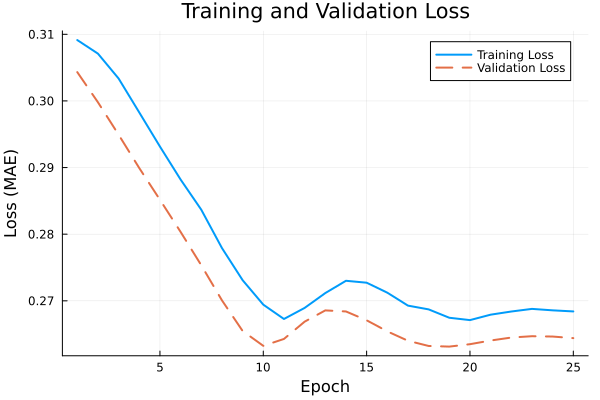

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


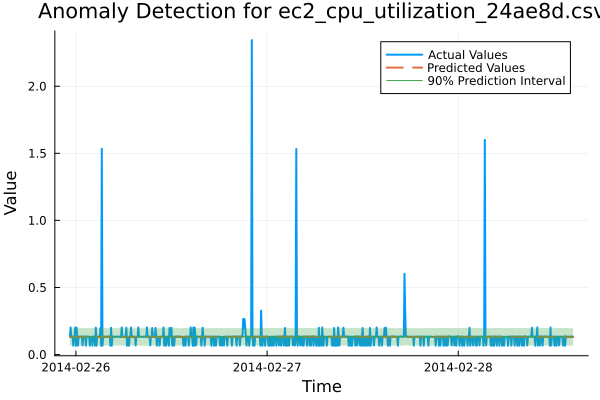

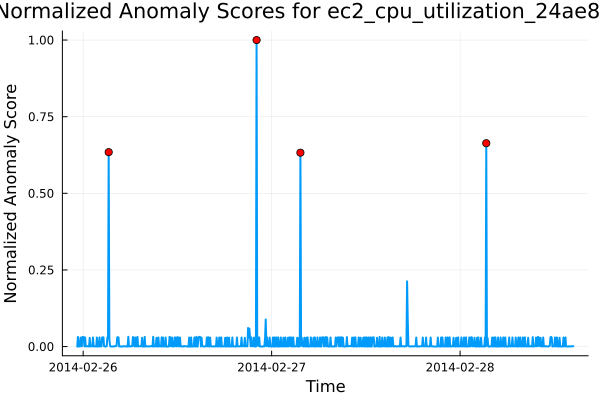


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_53ea38.csv ===
Processing dataset: ec2_cpu_utilization_53ea38.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.7315, Val Loss = 0.7439


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 16


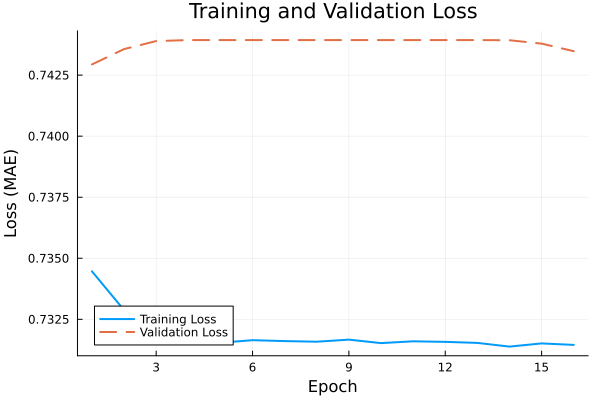

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


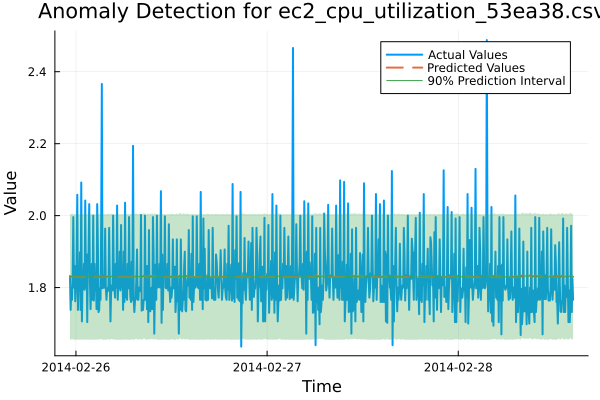

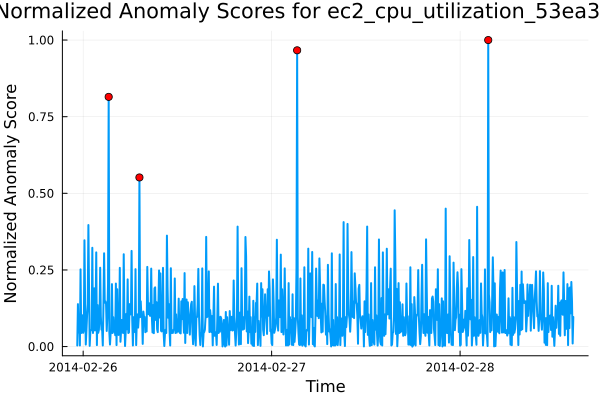


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_5f5533.csv ===
Processing dataset: ec2_cpu_utilization_5f5533.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.7932, Val Loss = 1.2882


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.7632, Val Loss = 1.266


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.7111, Val Loss = 1.2562


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 40: Train Loss = 0.6566, Val Loss = 1.2727


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 46


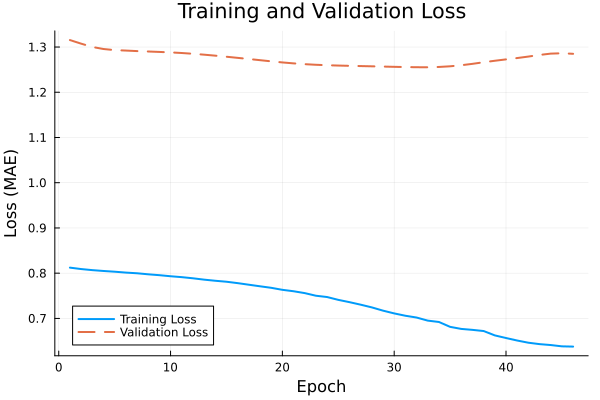

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


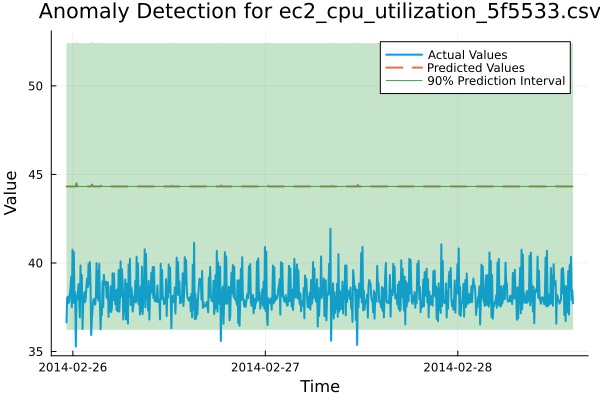

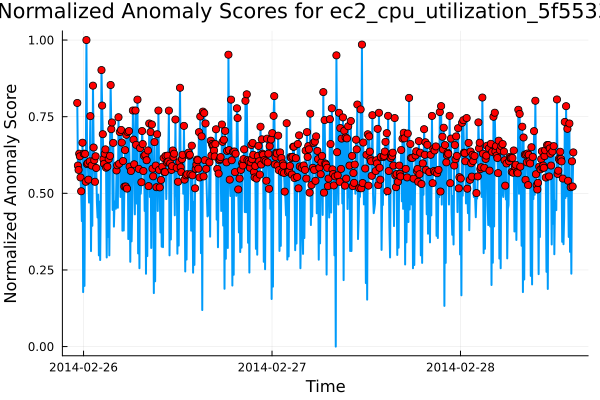


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_77c1ca.csv ===
Processing dataset: ec2_cpu_utilization_77c1ca.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.6521, Val Loss = 0.5263


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.6286, Val Loss = 0.5096


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.6052, Val Loss = 0.4933


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 40: Train Loss = 0.581, Val Loss = 0.4731


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 50: Train Loss = 0.5494, Val Loss = 0.4554


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 60: Train Loss = 0.5331, Val Loss = 0.4519


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 70: Train Loss = 0.5083, Val Loss = 0.4468


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 80: Train Loss = 0.5023, Val Loss = 0.4448


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 90: Train Loss = 0.4966, Val Loss = 0.4443


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 100: Train Loss = 0.4939, Val Loss = 0.4448


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 110


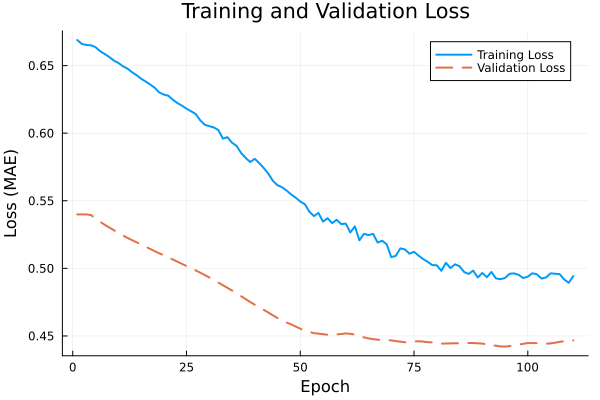

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


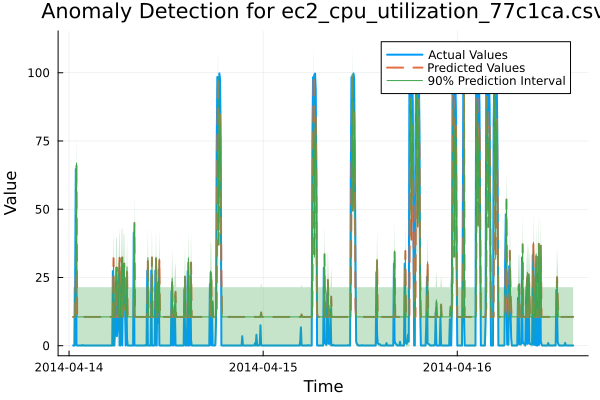

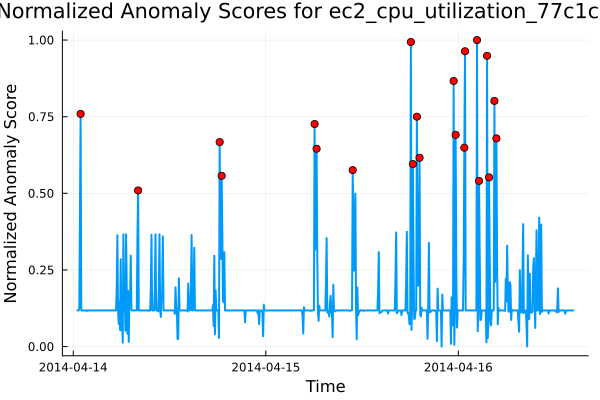


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_825cc2.csv ===
Processing dataset: ec2_cpu_utilization_825cc2.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.3961, Val Loss = 0.1476


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 16


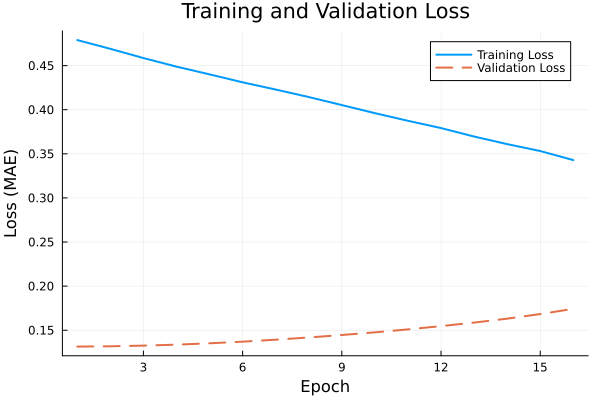

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


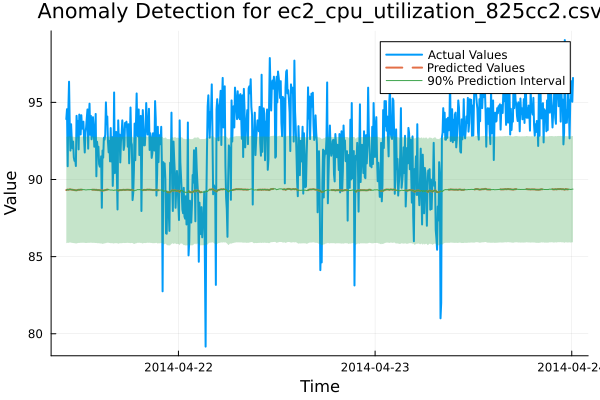

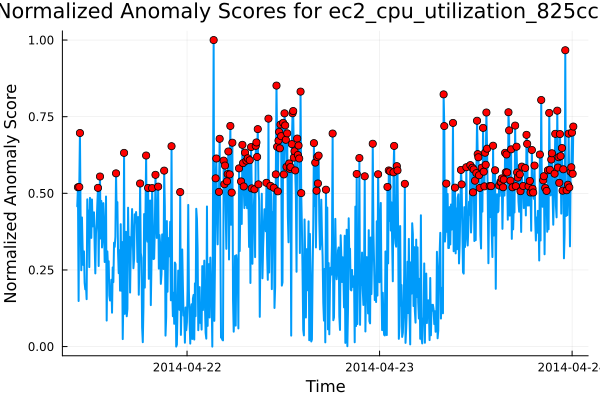


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_ac20cd.csv ===
Processing dataset: ec2_cpu_utilization_ac20cd.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.5015, Val Loss = 0.1886


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.4618, Val Loss = 0.1831


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 30


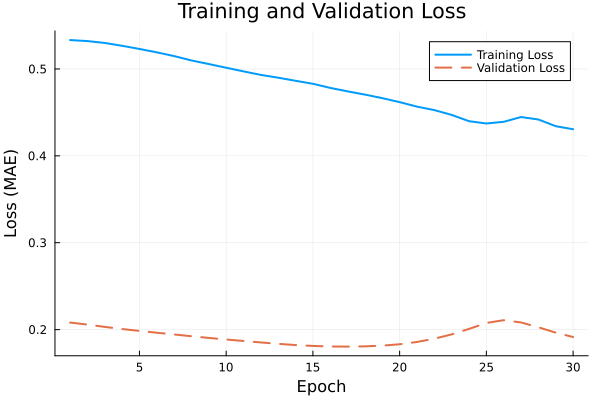

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


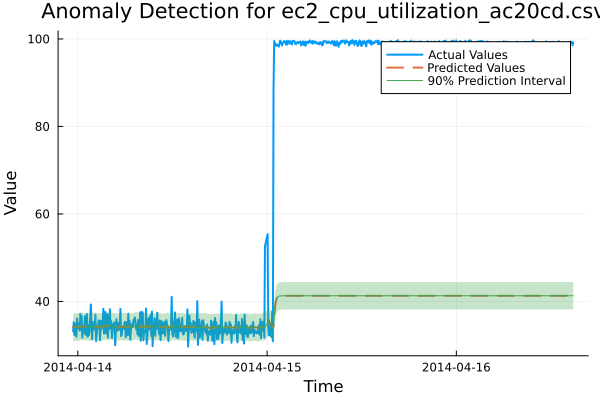

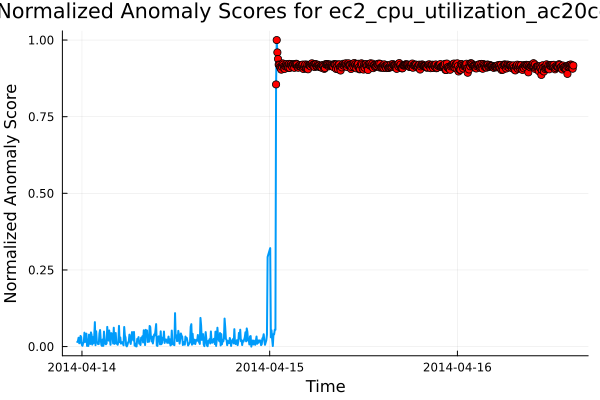


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_c6585a.csv ===
Processing dataset: ec2_cpu_utilization_c6585a.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.3718, Val Loss = 0.3649


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 17


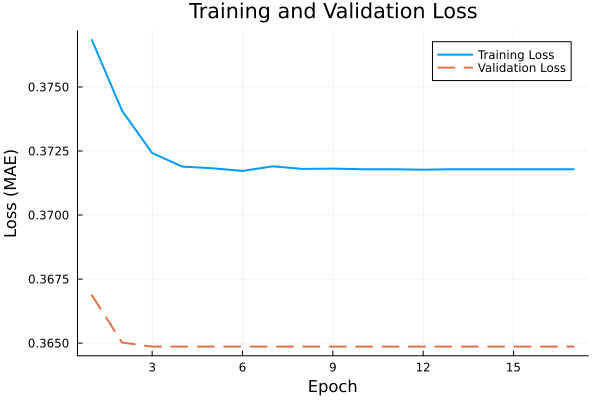

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


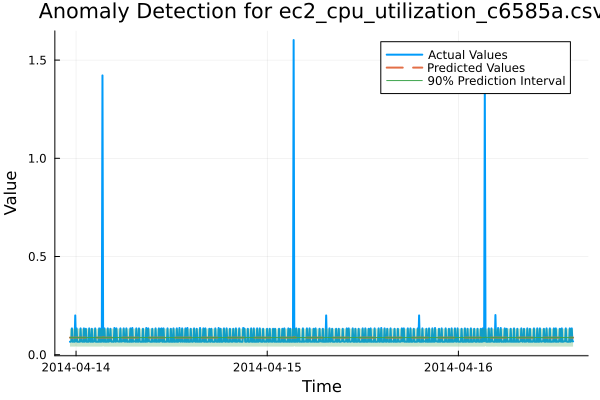

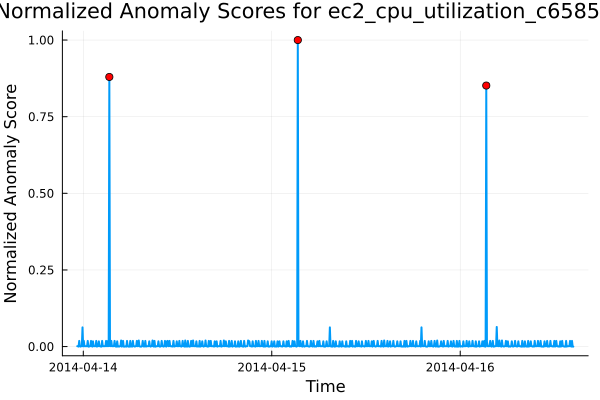


=== Processing: data/realAWSCloudwatch/ec2_cpu_utilization_fe7f93.csv ===
Processing dataset: ec2_cpu_utilization_fe7f93.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.4698, Val Loss = 0.449


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 16


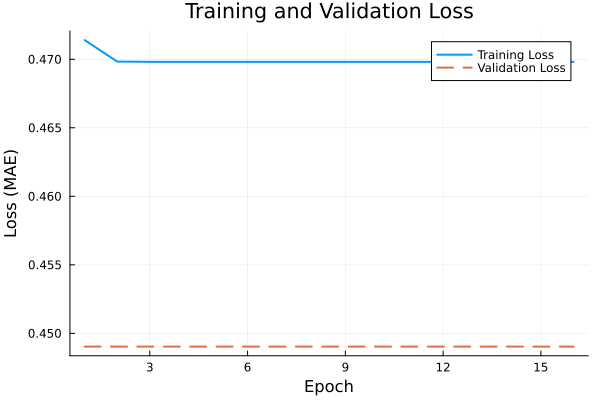

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


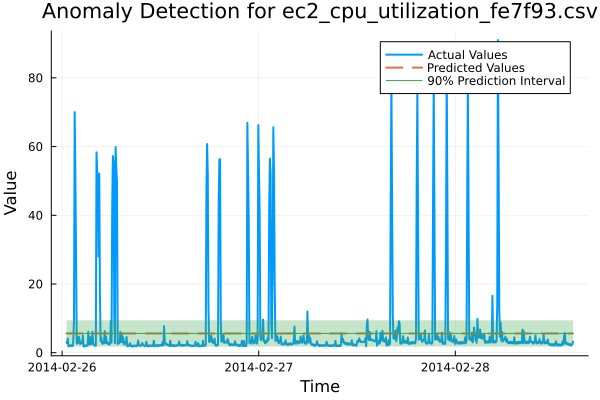

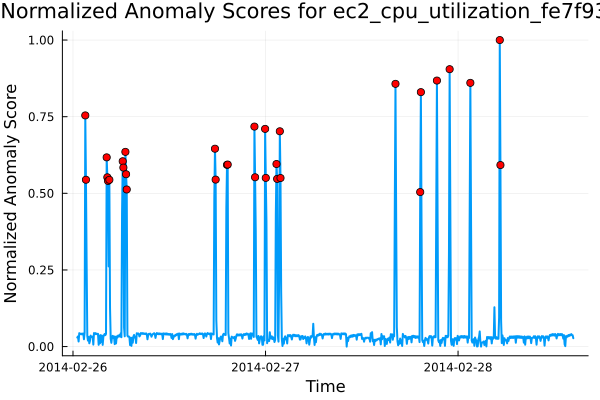


=== Processing: data/realAWSCloudwatch/ec2_disk_write_bytes_1ef3de.csv ===
Processing dataset: ec2_disk_write_bytes_1ef3de.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.326, Val Loss = 0.6556


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.3218, Val Loss = 0.6393


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.3181, Val Loss = 0.6356


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 37


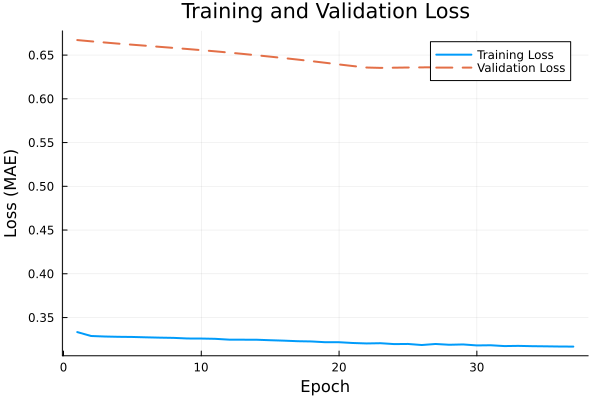

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


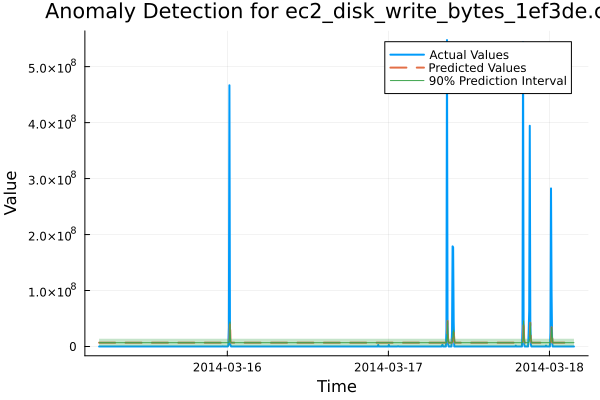

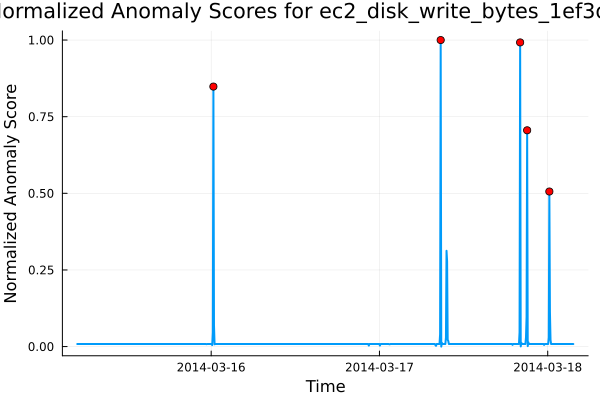


=== Processing: data/realAWSCloudwatch/ec2_disk_write_bytes_c0d644.csv ===
Processing dataset: ec2_disk_write_bytes_c0d644.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.3958, Val Loss = 0.2765


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.3905, Val Loss = 0.275


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.3897, Val Loss = 0.2737


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 40: Train Loss = 0.3878, Val Loss = 0.2729


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 50: Train Loss = 0.3863, Val Loss = 0.2721


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 60: Train Loss = 0.3832, Val Loss = 0.2709


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 70: Train Loss = 0.3814, Val Loss = 0.27


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 77


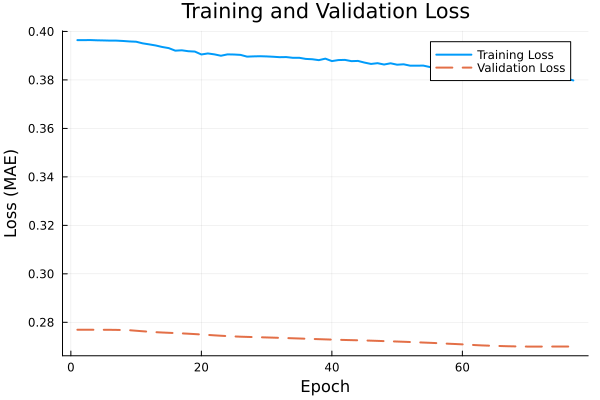

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


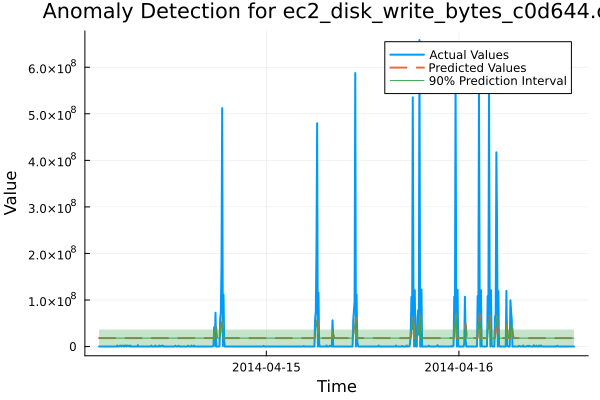

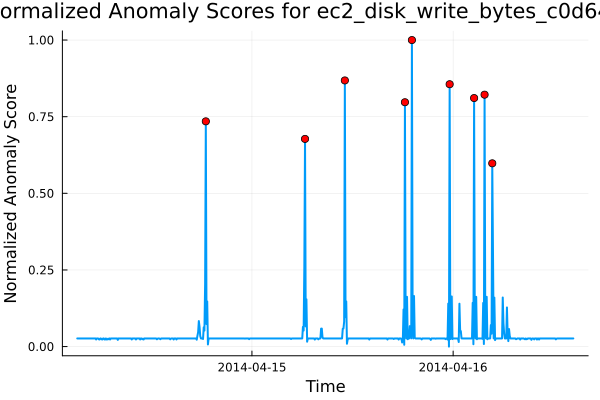


=== Processing: data/realAWSCloudwatch/ec2_network_in_257a54.csv ===
Processing dataset: ec2_network_in_257a54.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.1558, Val Loss = 0.0935


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 16


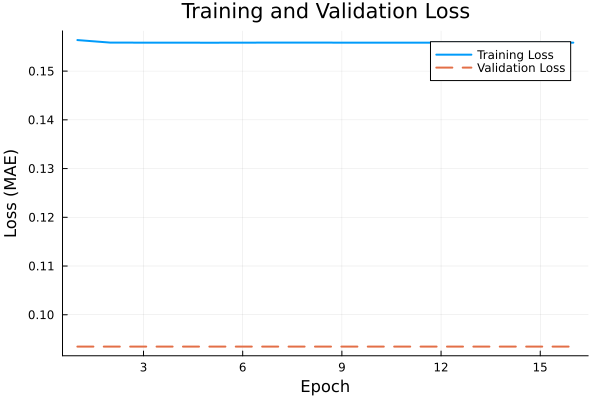

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


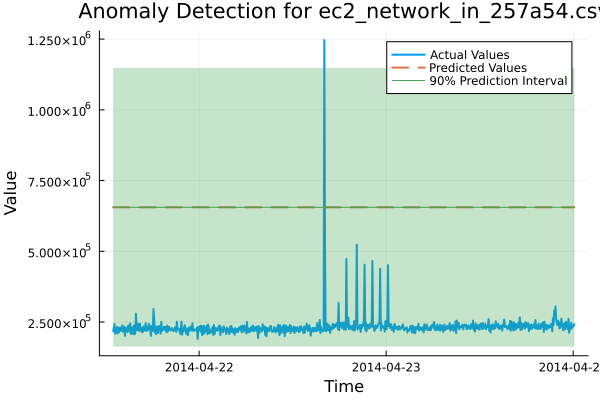

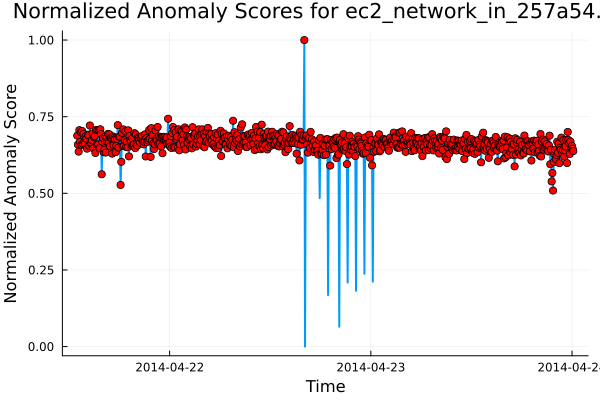


=== Processing: data/realAWSCloudwatch/ec2_network_in_5abac7.csv ===
Processing dataset: ec2_network_in_5abac7.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.298, Val Loss = 0.4224


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 16


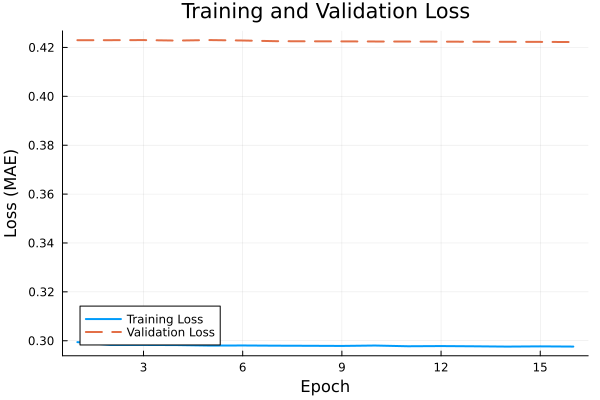

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


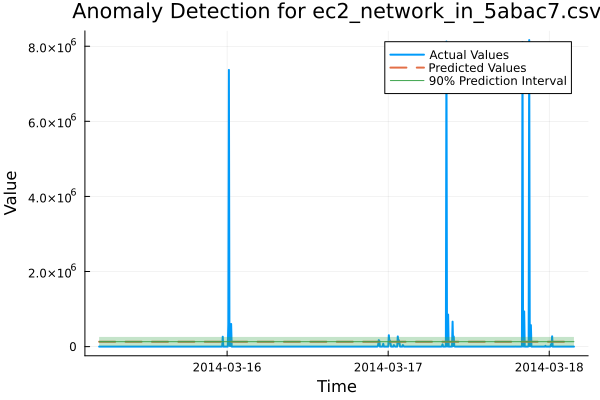

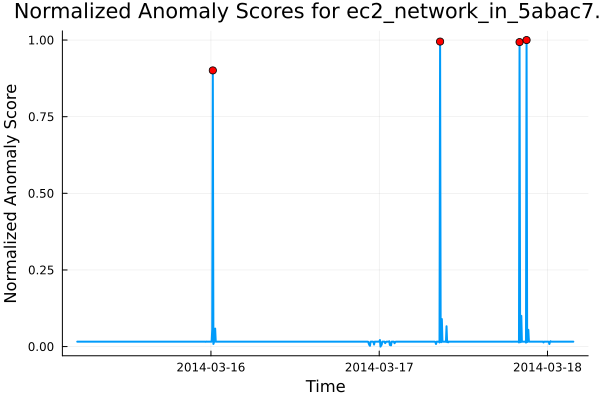


=== Processing: data/realAWSCloudwatch/elb_request_count_8c0756.csv ===
Processing dataset: elb_request_count_8c0756.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.7721, Val Loss = 0.6969


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 16


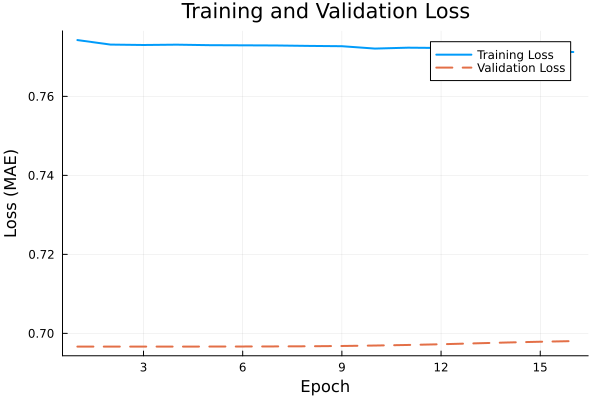

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


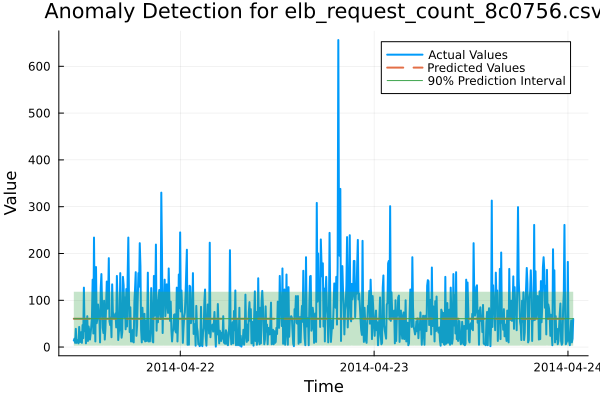

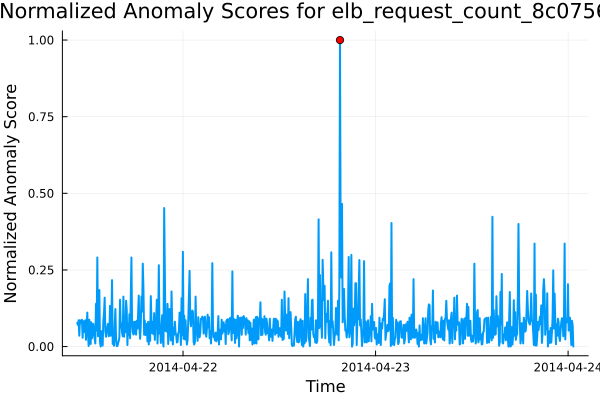


=== Processing: data/realAWSCloudwatch/grok_asg_anomaly.csv ===
Processing dataset: grok_asg_anomaly.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.66, Val Loss = 0.9142


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.6546, Val Loss = 0.8683


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.647, Val Loss = 0.8072


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 40: Train Loss = 0.6374, Val Loss = 0.7338


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 50: Train Loss = 0.6279, Val Loss = 0.6938


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 60: Train Loss = 0.6164, Val Loss = 0.6658


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 70: Train Loss = 0.6112, Val Loss = 0.6769


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 80: Train Loss = 0.6146, Val Loss = 0.6788


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 90: Train Loss = 0.6105, Val Loss = 0.6639


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 100: Train Loss = 0.6097, Val Loss = 0.6566


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 107


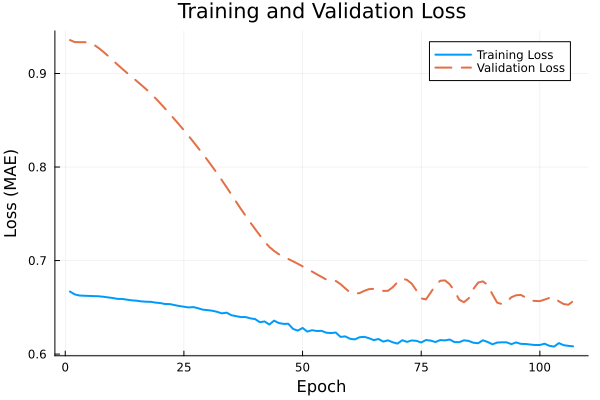

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


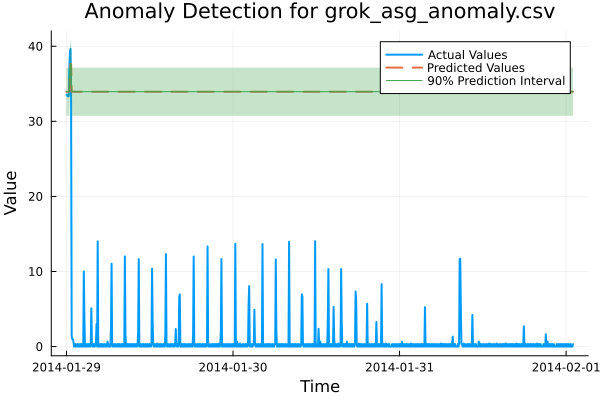

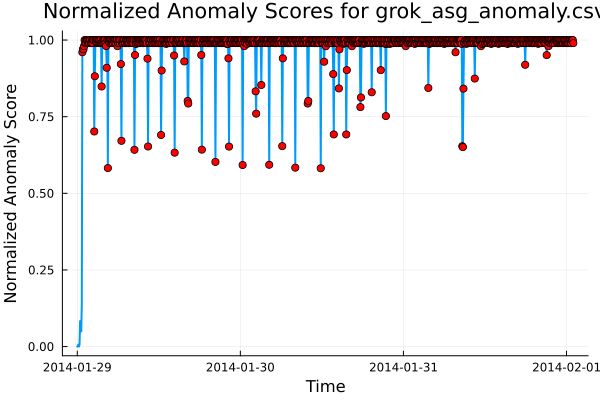


=== Processing: data/realAWSCloudwatch/iio_us-east-1_i-a2eb1cd9_NetworkIn.csv ===
Processing dataset: iio_us-east-1_i-a2eb1cd9_NetworkIn.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.4328, Val Loss = 0.1783


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.3962, Val Loss = 0.1759


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.3884, Val Loss = 0.1802


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Early stopping at epoch 37


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87


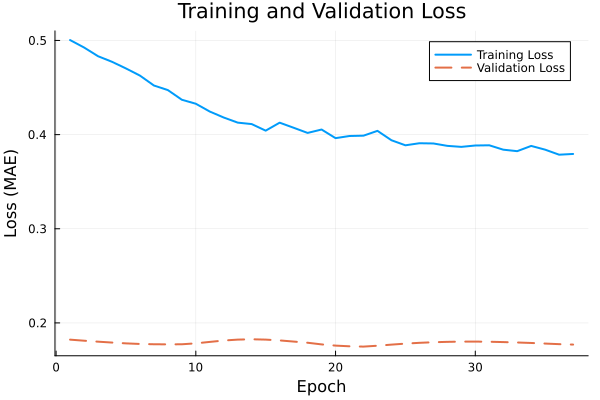

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


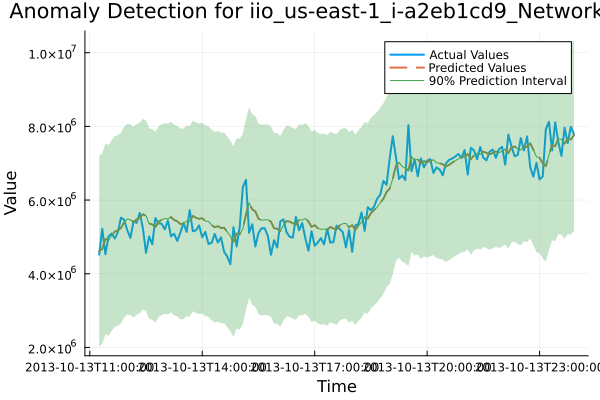

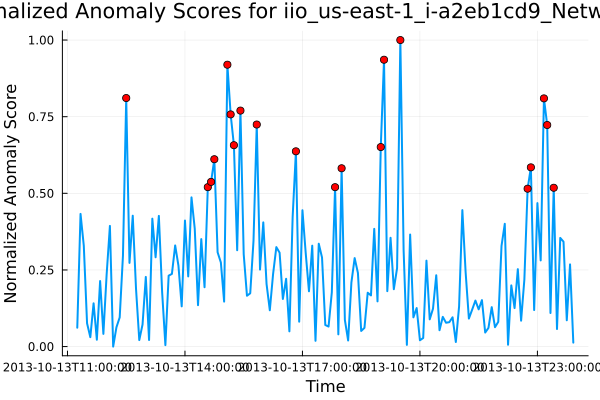


=== Processing: data/realAWSCloudwatch/rds_cpu_utilization_cc0c53.csv ===
Processing dataset: rds_cpu_utilization_cc0c53.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.7181, Val Loss = 6.6975


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.7157, Val Loss = 6.6876


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.7086, Val Loss = 6.6974


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87


Early stopping at epoch 33


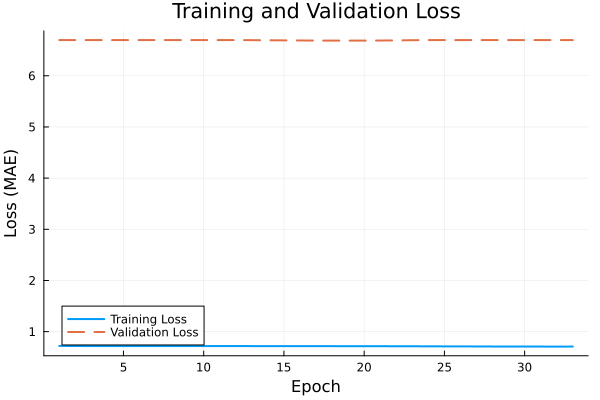

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


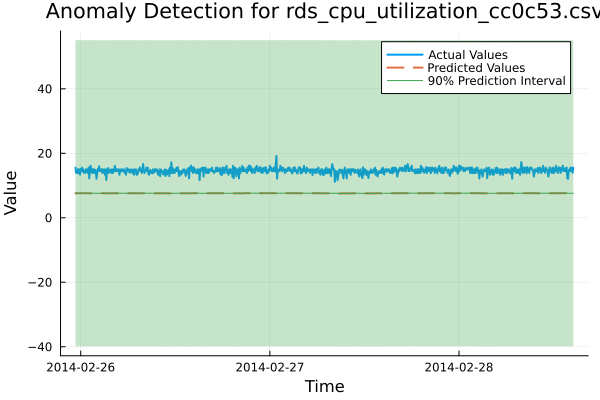

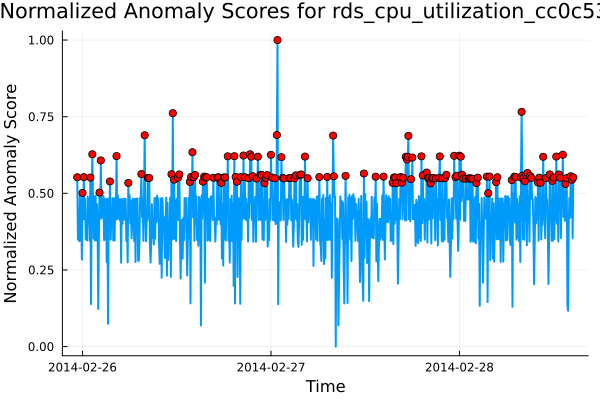


=== Processing: data/realAWSCloudwatch/rds_cpu_utilization_e47b3b.csv ===
Processing dataset: rds_cpu_utilization_e47b3b.csv
Training LSTM model...


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 10: Train Loss = 0.5387, Val Loss = 3.9429


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 20: Train Loss = 0.4968, Val Loss = 2.1199


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit 

Epoch 30: Train Loss = 0.4834, Val Loss = 3.1327


┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87
┌ Warning: explicit `update!(opt, model, grad)` wants the gradient for the model alone,
│ not the whole tuple from `gradient(m -> loss(m, x, y), model)`. You probably want `grads[1]`.
└ @ Flux ~/.julia/packages/Flux/3711C/src/layers/basic.jl:87


Early stopping at epoch 34


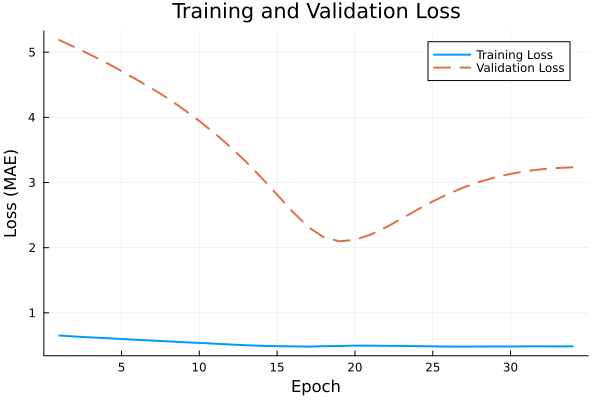

Training conformal predictor...
Making predictions with uncertainty...
Detecting anomalies...


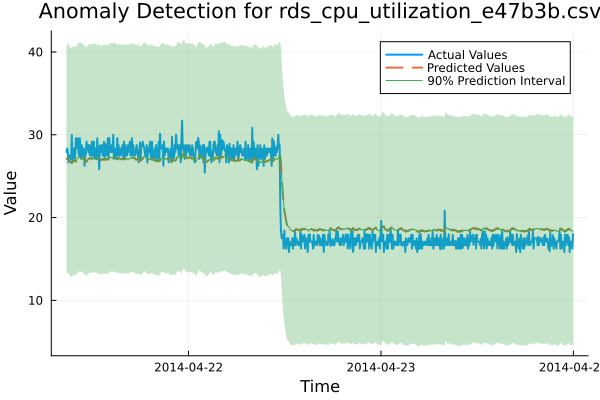

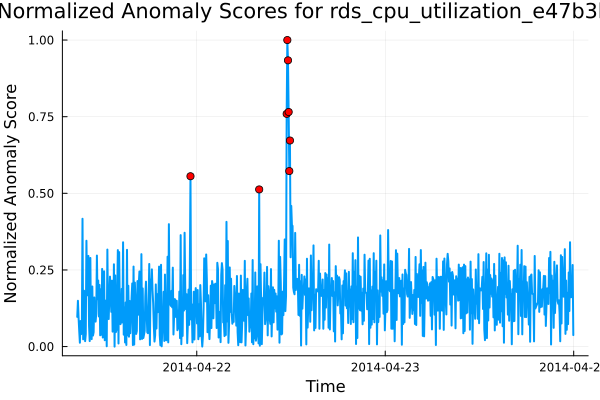

In [42]:
# Training phase (automatically determines seq_len)
# Main Function to initiate the pipeline
run_nab_benchmark()
